<a href="https://colab.research.google.com/github/JGCMachado/Notebooks/blob/main/Chest_XRay_Teste3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Importação da imagem
from IPython.display import Image
Image(url='https://raw.githubusercontent.com/JGCMachado/Imagens/main/chestxray.jpg')

In [ ]:
#!pip install gdown

In [3]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
import gdown

In [4]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

In [5]:
# Path onde se encontra o arquivo 'train3classes.zip'
file_id = '1g2VtBkiHZPa3nu7ODBgfHbXj4moN4DN4'
url = f"https://drive.google.com/uc?id={file_id}"
output = "train3classes.zip"
gdown.download(url, output)


Downloading...
From: https://drive.google.com/uc?id=1g2VtBkiHZPa3nu7ODBgfHbXj4moN4DN4
To: /content/train3classes.zip
100%|██████████| 949M/949M [00:08<00:00, 106MB/s]


'train3classes.zip'

In [6]:
# Criando a pasta de destino se necessário
# Path onde se encontra o arquivo 'train.zip'
train = 'train3classes.zip'
destination = 'datasets/chest/train3classes/'

os.makedirs(destination,exist_ok=True)

with zipfile.ZipFile(train,'r') as zip_ref:
    zip_ref.extractall(destination)

In [7]:
print(os.listdir(destination))

['virus (142).jpeg', 'virus (221).jpeg', 'normal (148).jpeg', 'normal (443).jpeg', 'normal (466).jpeg', 'bacteria (653).jpeg', 'normal (992).jpeg', 'virus (497).jpeg', 'virus (534).jpeg', 'virus (430).jpeg', 'bacteria (297).jpeg', 'virus (589).jpeg', 'bacteria (333).jpeg', 'bacteria (525).jpeg', 'normal (493).jpeg', 'virus (293).jpeg', 'bacteria (722).jpeg', 'virus (884).jpeg', 'normal (1179).jpeg', 'virus (851).jpeg', 'bacteria (1176).jpeg', 'virus (577).jpeg', 'normal (977).jpeg', 'normal (79).jpeg', 'bacteria (1131).jpeg', 'virus (876).jpeg', 'virus (351).jpeg', 'virus (463).jpeg', 'virus (973).jpeg', 'bacteria (1009).jpeg', 'virus (52).jpeg', 'bacteria (258).jpeg', 'normal (944).jpeg', 'bacteria (595).jpeg', 'normal (498).jpeg', 'normal (88).jpeg', 'bacteria (390).jpeg', 'bacteria (1133).jpeg', 'bacteria (1032).jpeg', 'normal (223).jpeg', 'bacteria (228).jpeg', 'normal (98).jpeg', 'normal (385).jpeg', 'virus (386).jpeg', 'virus (241).jpeg', 'virus (443).jpeg', 'bacteria (434).jpeg'

In [8]:
print(f"Temos um total de {len(os.listdir(destination))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 3600 imagens para o treinamento e avaliação do modelo de deep learning


In [9]:
print(f"Primeiras 20 imagens: \n {os.listdir(destination)[:20]}")

Primeiras 20 imagens: 
 ['virus (142).jpeg', 'virus (221).jpeg', 'normal (148).jpeg', 'normal (443).jpeg', 'normal (466).jpeg', 'bacteria (653).jpeg', 'normal (992).jpeg', 'virus (497).jpeg', 'virus (534).jpeg', 'virus (430).jpeg', 'bacteria (297).jpeg', 'virus (589).jpeg', 'bacteria (333).jpeg', 'bacteria (525).jpeg', 'normal (493).jpeg', 'virus (293).jpeg', 'bacteria (722).jpeg', 'virus (884).jpeg', 'normal (1179).jpeg', 'virus (851).jpeg']


In [10]:
images =os.listdir(destination)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    classe = str(fname)[:5]
    if classe == 'norma':
       labels.append('normal')
    elif classe == 'virus':
       labels.append('virus')
    else:
       labels.append('bacteria')

    img_shape = mpimg.imread(destination+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    if len(img_shape) > 2:
       channels.append(img_shape[2])
    else:
       channels.append(2)  # Defina um valor padrão para canais se não houver terceira dimensão
    filesize.append(os.path.getsize(destination+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

In [11]:
df.head()

,images,class,height,width,channels,filesize
0,virus (142).jpeg,virus,904,1264,2,93249
1,virus (221).jpeg,virus,1448,2008,2,211697
2,normal (148).jpeg,normal,1507,1808,2,762682
3,normal (443).jpeg,normal,1322,1640,2,511302
4,normal (466).jpeg,normal,1855,2344,2,948018


In [12]:
df.count()

images      3600
class       3600
height      3600
width       3600
channels    3600
filesize    3600
dtype: int64

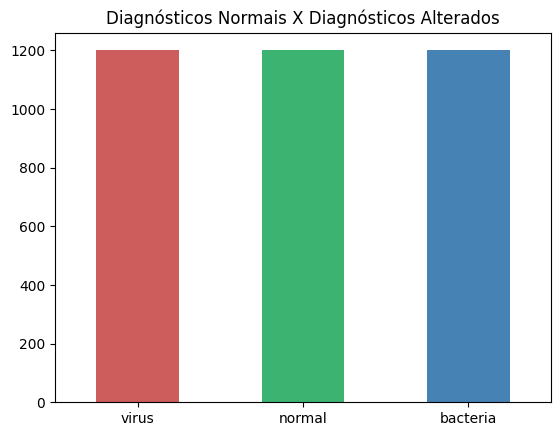

In [13]:
# Obtenha os valores e as contagens das classes
class_counts = df['class'].value_counts()

# Defina os tons médios de verde, vermelho e azul para cada classe
colors = ['indianred',  'mediumseagreen', 'steelblue']  # Exemplo de tons médios de cores pré-definidas

# Crie a figura e o eixo
fig, ax = plt.subplots()

# Crie o gráfico de barras com os tons médios de cores
class_counts.plot(kind='bar', color=colors, ax=ax)

# Configure o título do gráfico
ax.set_title('Diagnósticos Normais X Diagnósticos Alterados')

# Rotacione os rótulos do eixo x para a posição horizontal
ax.set_xticklabels(class_counts.index, rotation=0)

# Exiba o gráfico
plt.show()

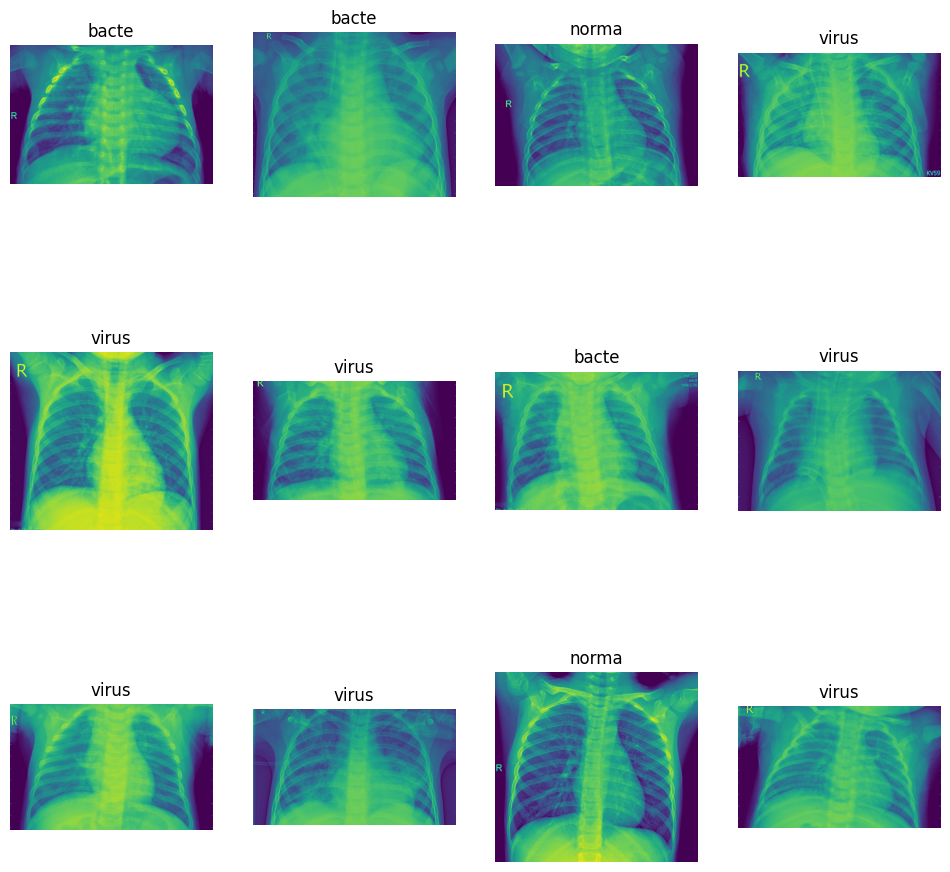

In [14]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =destination+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:5])

plt.show()

In [15]:
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.3 ,random_state=42 , shuffle=True)

In [16]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                   images     class
3411     virus (896).jpeg     virus
276     virus (1013).jpeg     virus
3049     virus (977).jpeg     virus
1991    normal (532).jpeg    normal
3418     virus (438).jpeg     virus
...                   ...       ...
1130  bacteria (205).jpeg  bacteria
1294    normal (647).jpeg    normal
860      virus (243).jpeg     virus
3507   bacteria (88).jpeg  bacteria
3174   normal (1063).jpeg    normal

[2520 rows x 2 columns]
##### Test: #####
                    images     class
1340      virus (325).jpeg     virus
1601   bacteria (368).jpeg  bacteria
3549      virus (407).jpeg     virus
3575      virus (109).jpeg     virus
211       virus (253).jpeg     virus
...                    ...       ...
2835      virus (200).jpeg     virus
498   bacteria (1146).jpeg  bacteria
1234     normal (981).jpeg    normal
435    bacteria (617).jpeg  bacteria
365      normal (845).jpeg    normal

[1080 rows x 2 columns]


In [17]:
batch_size = 80
img_height = 150
img_width = 150
num_classes = 3

In [18]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,destination,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    x_col='images',
    y_col='class',)

Found 2016 validated image filenames belonging to 3 classes.
Found 504 validated image filenames belonging to 3 classes.
Found 1080 validated image filenames belonging to 3 classes.


Found 1 validated image filenames belonging to 1 classes.


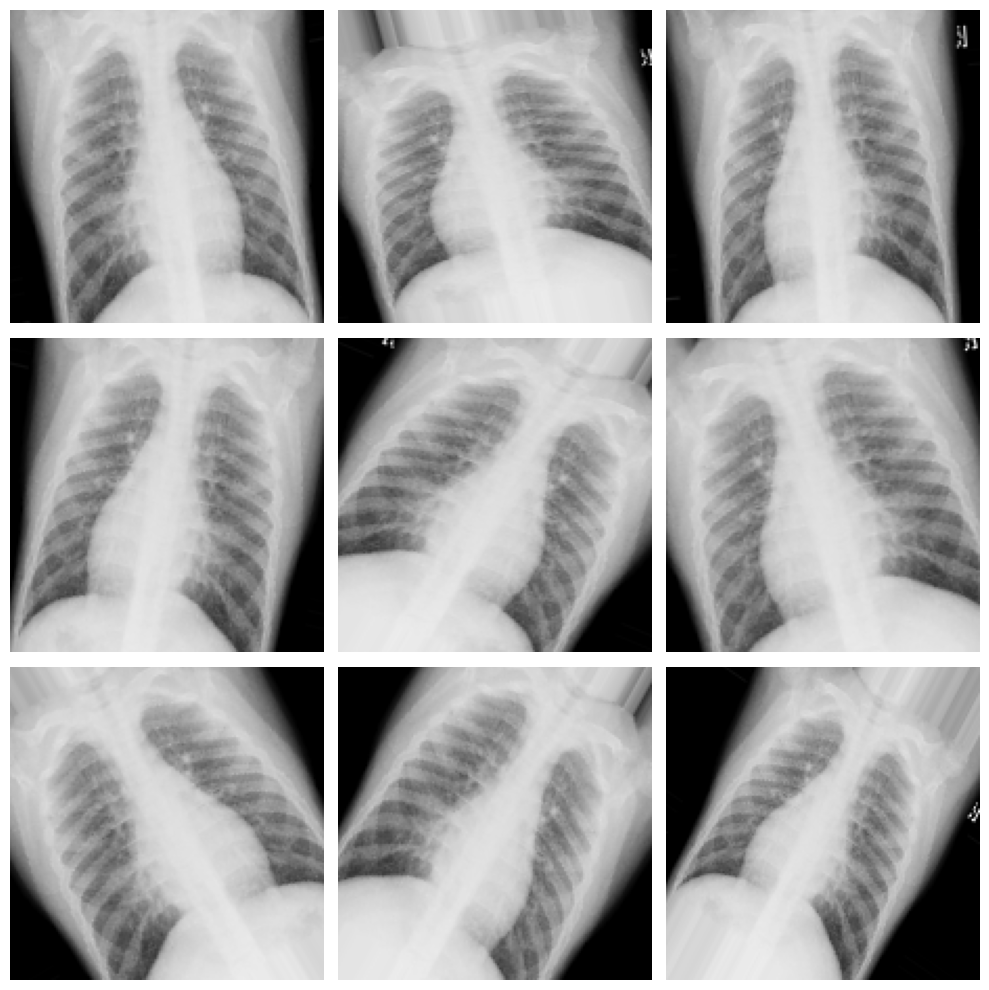

In [20]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    destination,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

In [21]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(img_height,img_width,num_classes ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [22]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( num_classes , activation='softmax' ) )

In [23]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [24]:
model.compile(optimizer='adam', loss='categorical_crossentropy' , metrics=['accuracy'])

In [25]:
history=model.fit(train_generator ,
                  epochs=10 ,
                  validation_data=val_generator)

Epoch 1/2
26/26 [==============================] - 163s 6s/step - loss: 1.1149 - accuracy: 0.3795 - val_loss: 1.0847 - val_accuracy: 0.5000
Epoch 2/2
26/26 [==============================] - 162s 6s/step - loss: 1.0285 - accuracy: 0.5119 - val_loss: 0.9350 - val_accuracy: 0.5198


3/3 [==============================] - 1s 331ms/step


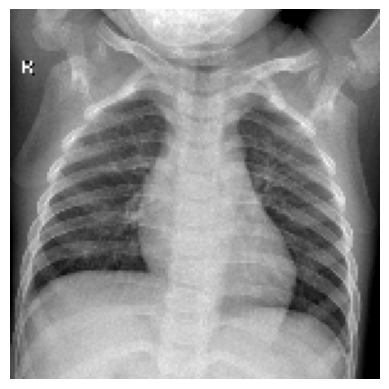

Label:  normal
Previsão:  normal
Probabilidade:  0.45695907


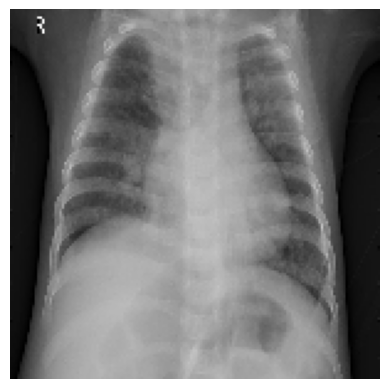

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.51883435


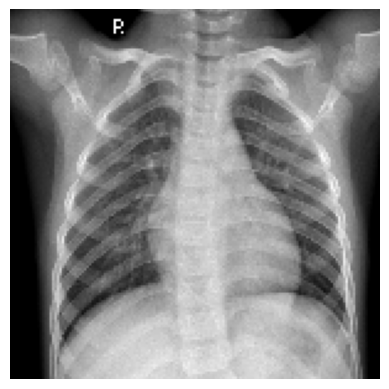

Label:  normal
Previsão:  normal
Probabilidade:  0.6430648


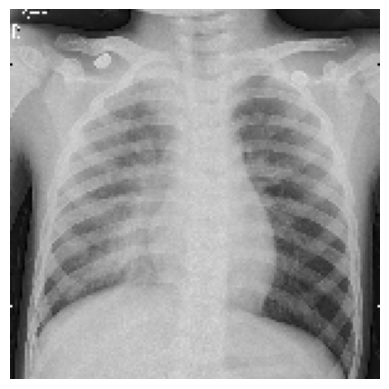

Label:  virus
Previsão:  bacteria
Probabilidade:  0.4603837


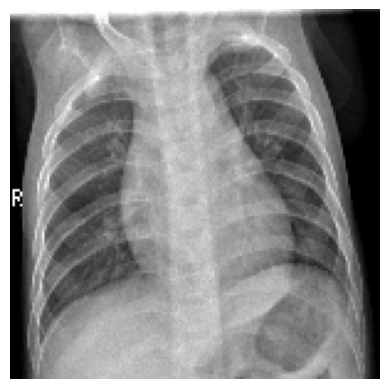

Label:  normal
Previsão:  bacteria
Probabilidade:  0.42512786


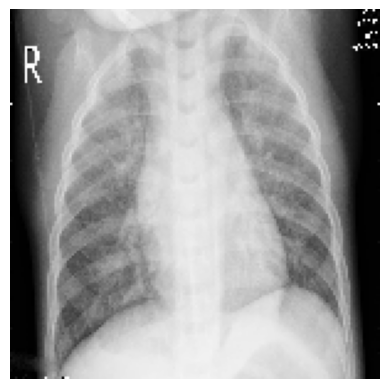

Label:  virus
Previsão:  bacteria
Probabilidade:  0.59809923


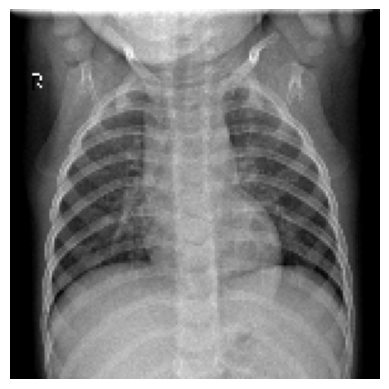

Label:  normal
Previsão:  normal
Probabilidade:  0.5008674


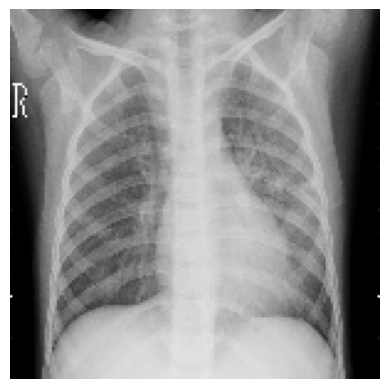

Label:  virus
Previsão:  bacteria
Probabilidade:  0.49985063


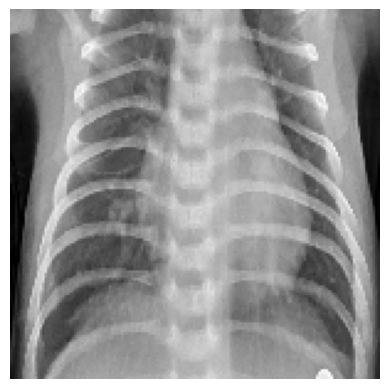

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5200027


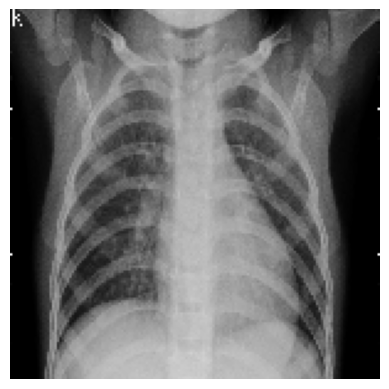

Label:  virus
Previsão:  normal
Probabilidade:  0.3370073


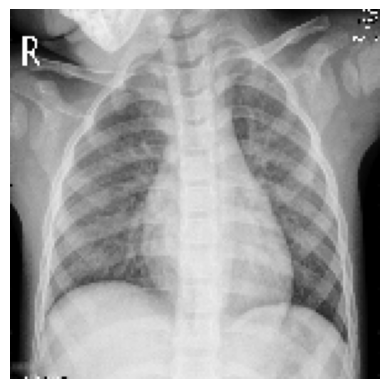

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5539534


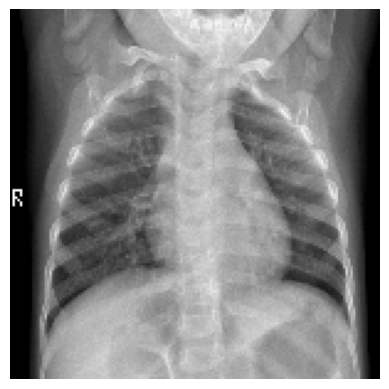

Label:  normal
Previsão:  normal
Probabilidade:  0.43420348


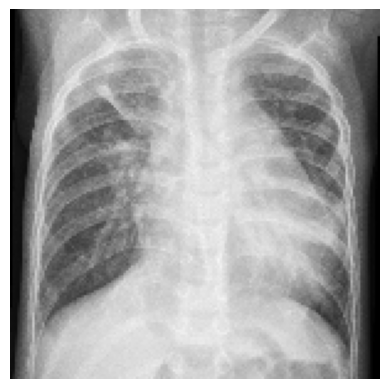

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.65364593


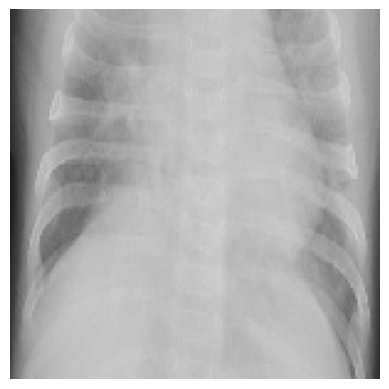

Label:  virus
Previsão:  bacteria
Probabilidade:  0.6727513


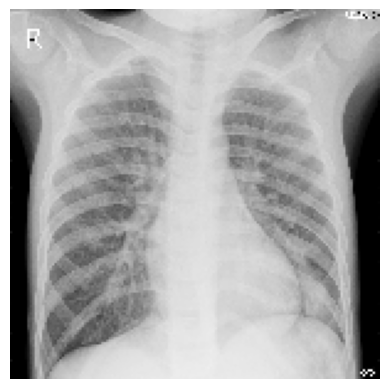

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.58350974


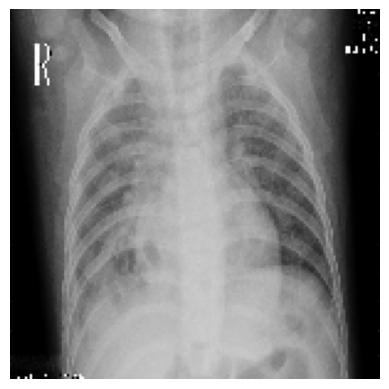

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.47854286


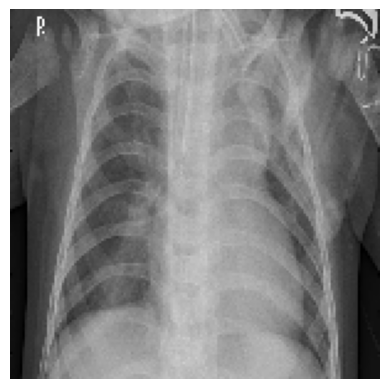

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5546451


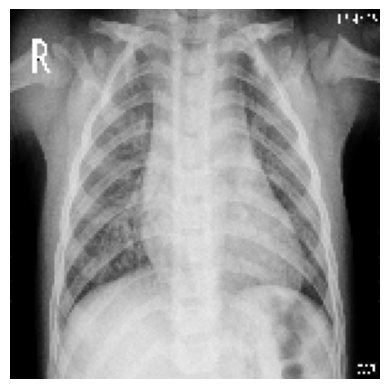

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5349906


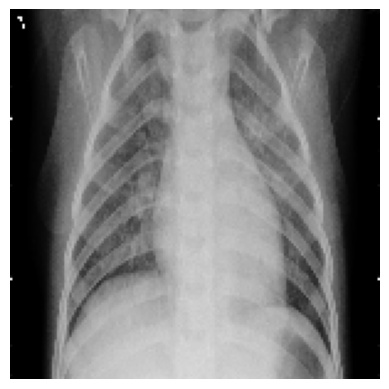

Label:  virus
Previsão:  virus
Probabilidade:  0.44635764


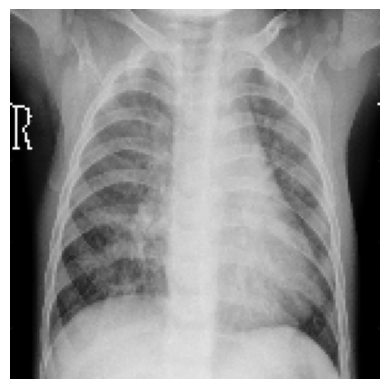

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5145986


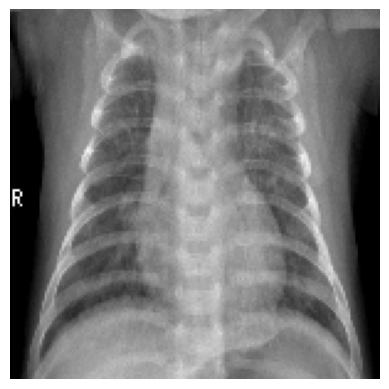

Label:  virus
Previsão:  bacteria
Probabilidade:  0.3927622


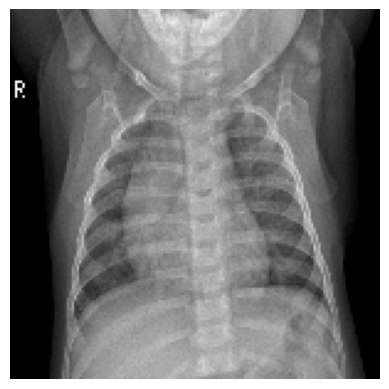

Label:  normal
Previsão:  virus
Probabilidade:  0.40273824


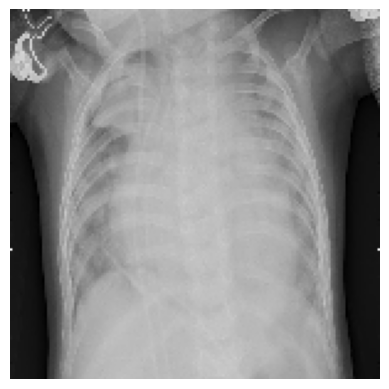

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6422543


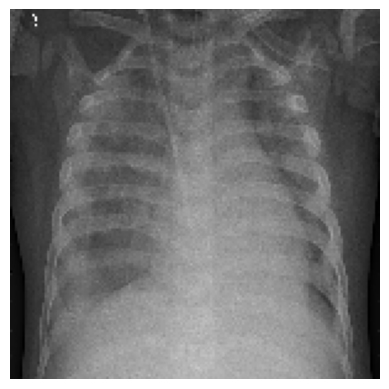

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5277074


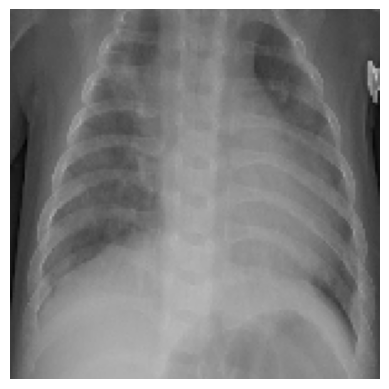

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5815734


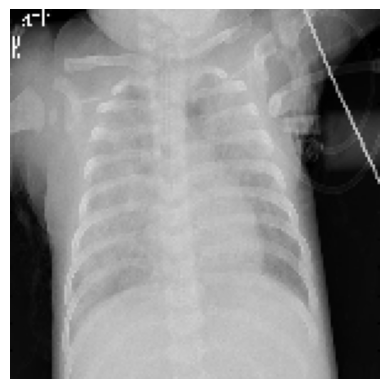

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6054872


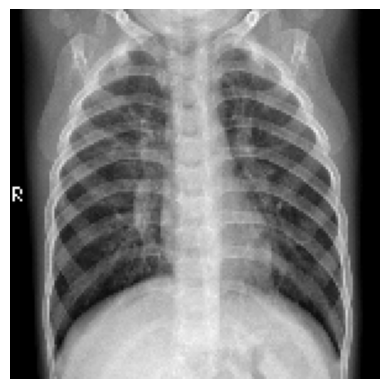

Label:  virus
Previsão:  normal
Probabilidade:  0.5512381


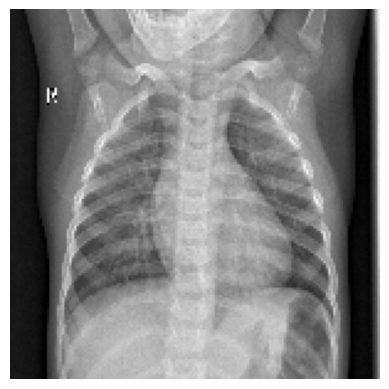

Label:  normal
Previsão:  normal
Probabilidade:  0.39357808


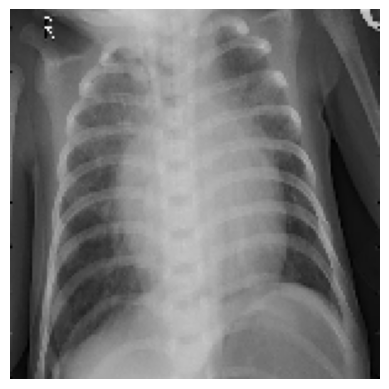

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5759383


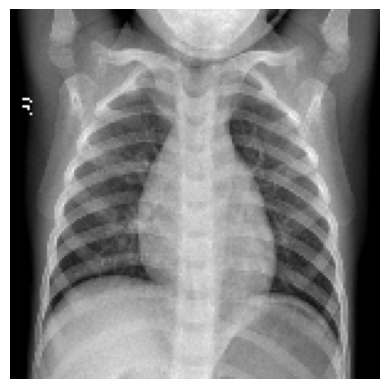

Label:  normal
Previsão:  normal
Probabilidade:  0.54615575


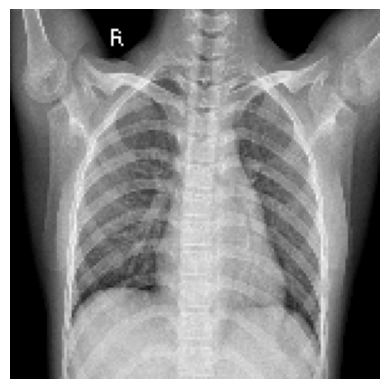

Label:  normal
Previsão:  normal
Probabilidade:  0.8043938


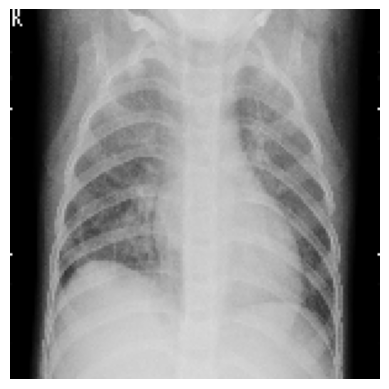

Label:  bacteria
Previsão:  virus
Probabilidade:  0.45452046


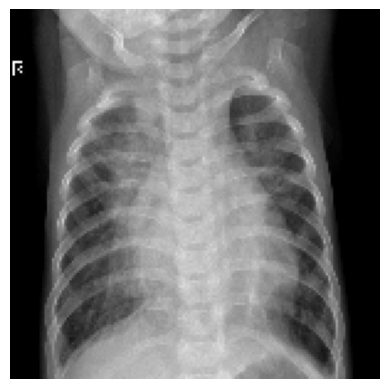

Label:  bacteria
Previsão:  virus
Probabilidade:  0.44131175


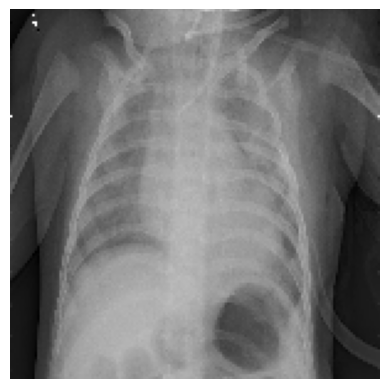

Label:  virus
Previsão:  bacteria
Probabilidade:  0.61126333


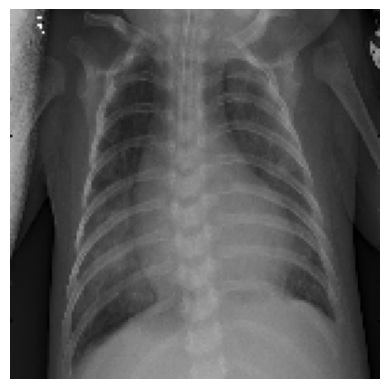

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.48333937


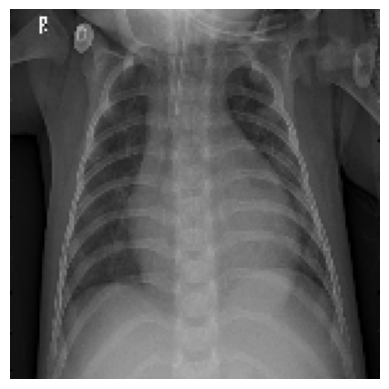

Label:  virus
Previsão:  bacteria
Probabilidade:  0.48421454


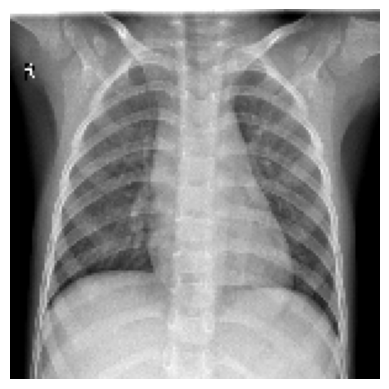

Label:  normal
Previsão:  bacteria
Probabilidade:  0.3673647


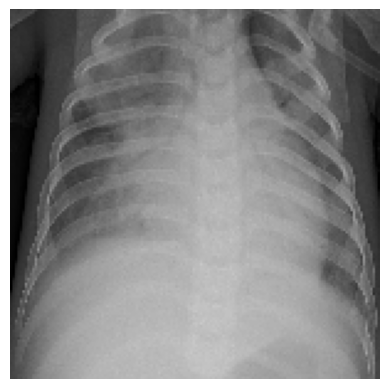

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.60055494


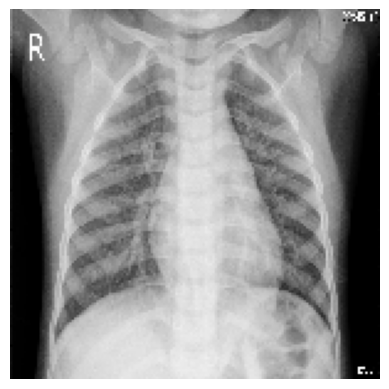

Label:  virus
Previsão:  bacteria
Probabilidade:  0.4484828


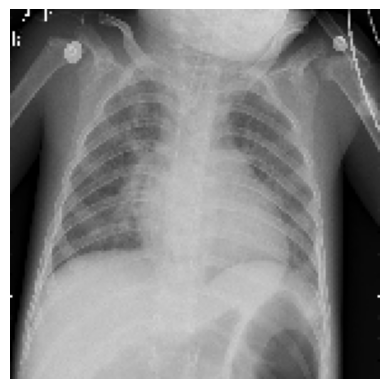

Label:  virus
Previsão:  bacteria
Probabilidade:  0.56655186


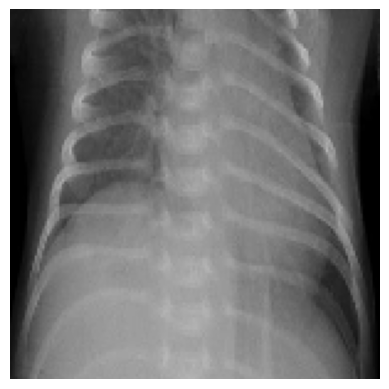

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.52574396


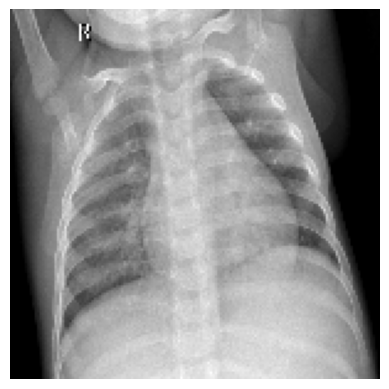

Label:  normal
Previsão:  bacteria
Probabilidade:  0.4081526


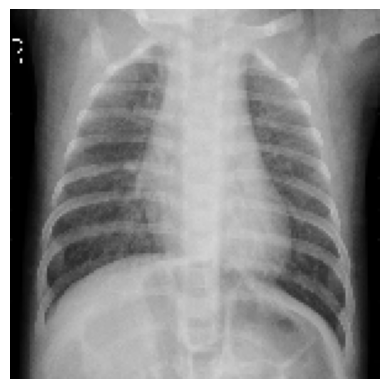

Label:  virus
Previsão:  bacteria
Probabilidade:  0.4788978


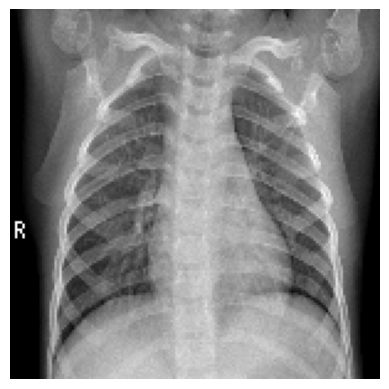

Label:  normal
Previsão:  normal
Probabilidade:  0.5033123


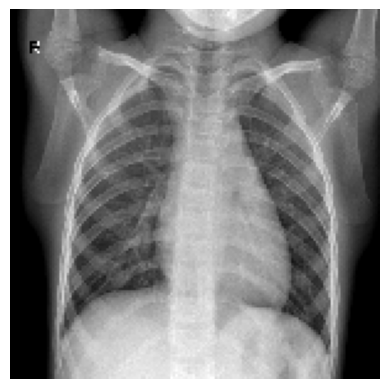

Label:  normal
Previsão:  normal
Probabilidade:  0.5526729


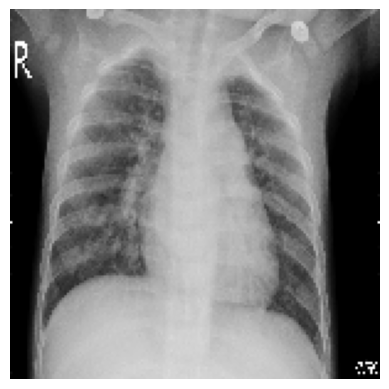

Label:  virus
Previsão:  bacteria
Probabilidade:  0.49731886


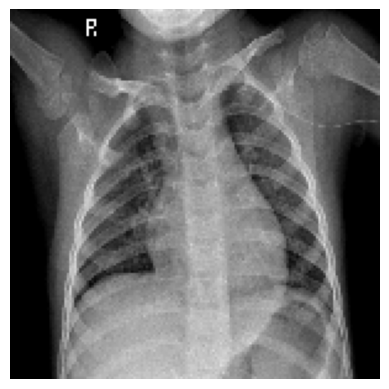

Label:  normal
Previsão:  normal
Probabilidade:  0.6801311


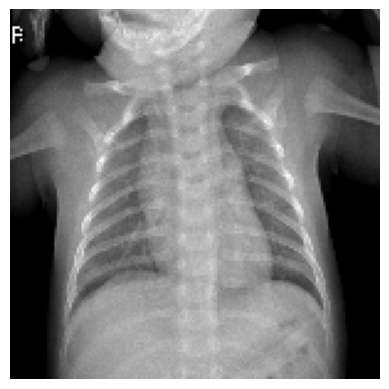

Label:  normal
Previsão:  normal
Probabilidade:  0.43141308


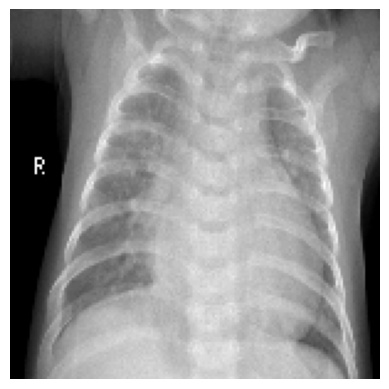

Label:  bacteria
Previsão:  virus
Probabilidade:  0.5394706


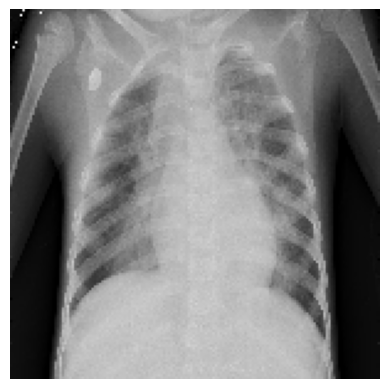

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5433833


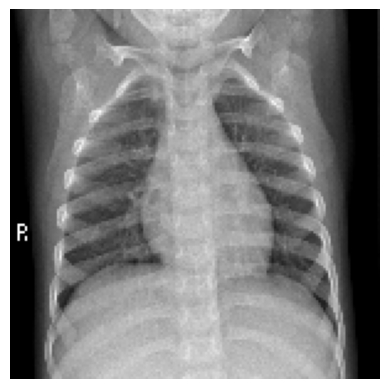

Label:  normal
Previsão:  normal
Probabilidade:  0.49752712


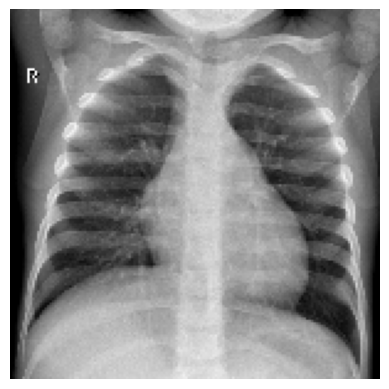

Label:  normal
Previsão:  normal
Probabilidade:  0.474263


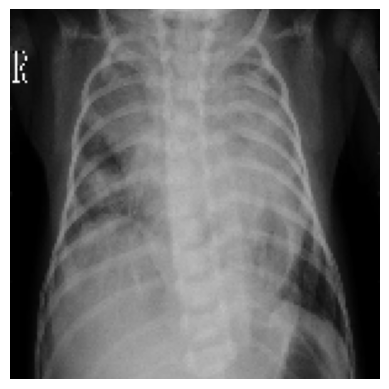

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.55449605


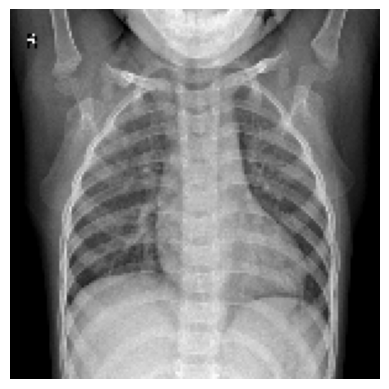

Label:  normal
Previsão:  normal
Probabilidade:  0.50449806


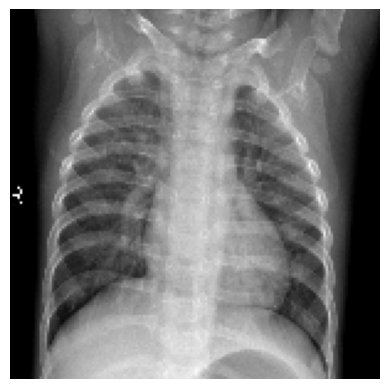

Label:  virus
Previsão:  normal
Probabilidade:  0.44796455


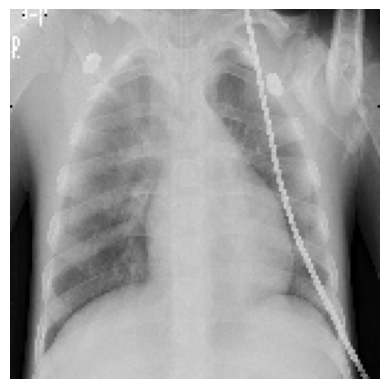

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5556838


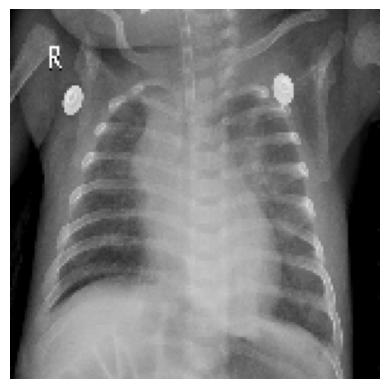

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.44775477


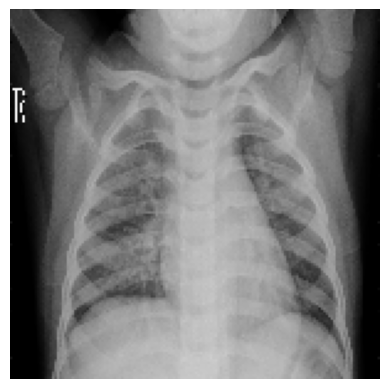

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.46311757


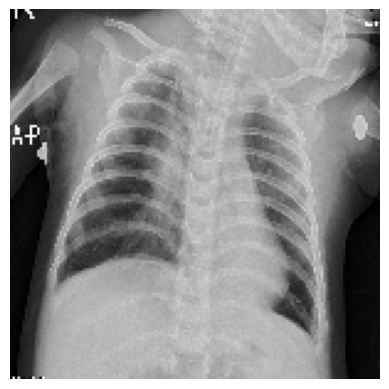

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.469859


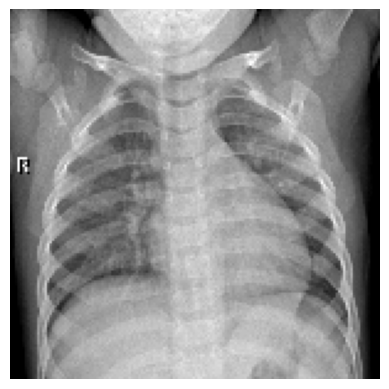

Label:  normal
Previsão:  normal
Probabilidade:  0.43508336


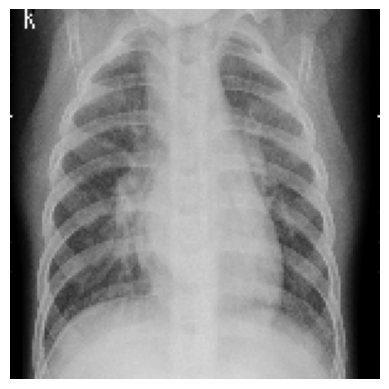

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5444423


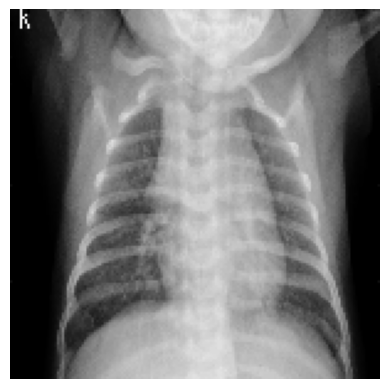

Label:  virus
Previsão:  virus
Probabilidade:  0.46754444


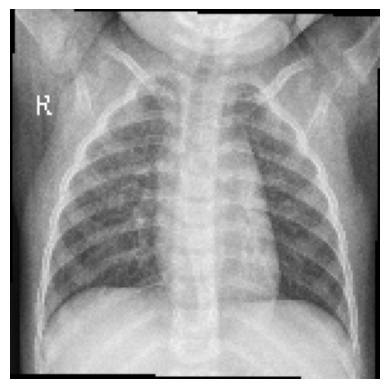

Label:  normal
Previsão:  bacteria
Probabilidade:  0.46371222


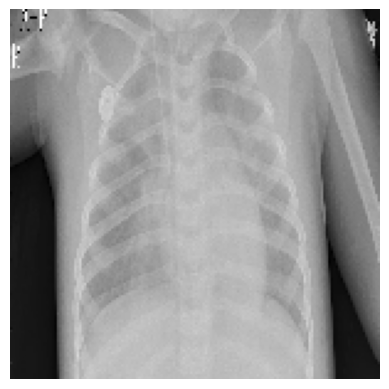

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.62662196


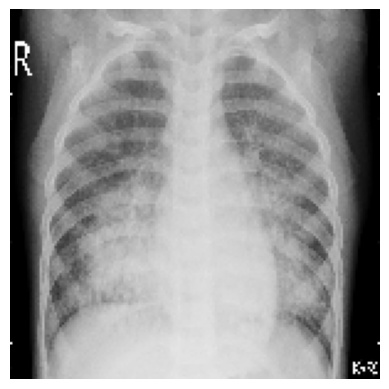

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.60602075


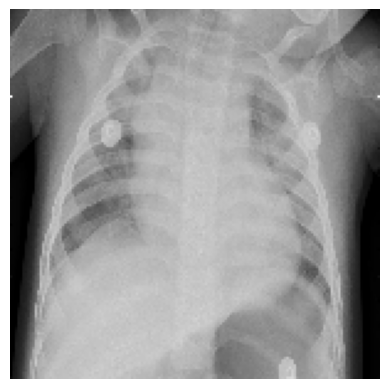

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6092005


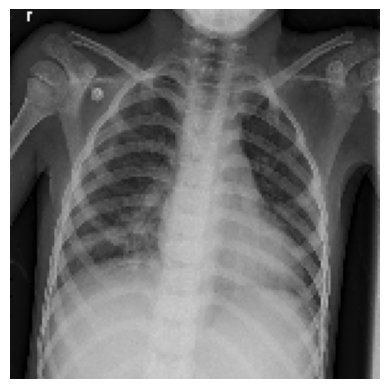

Label:  bacteria
Previsão:  normal
Probabilidade:  0.41717923


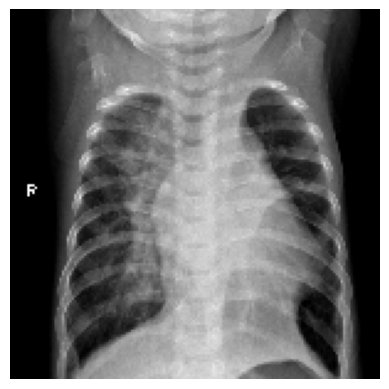

Label:  bacteria
Previsão:  virus
Probabilidade:  0.47738004


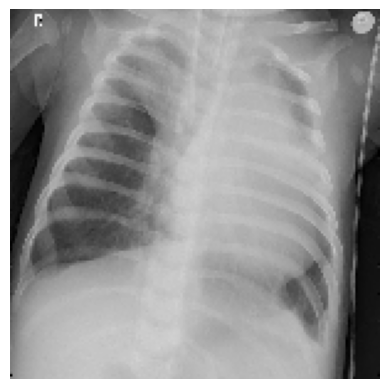

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.58314246


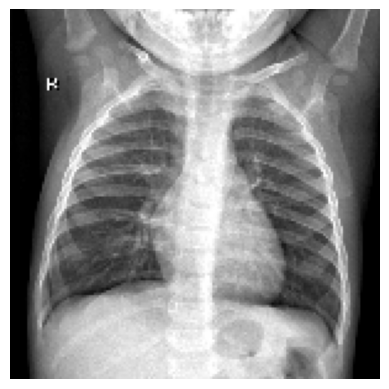

Label:  normal
Previsão:  normal
Probabilidade:  0.60538656


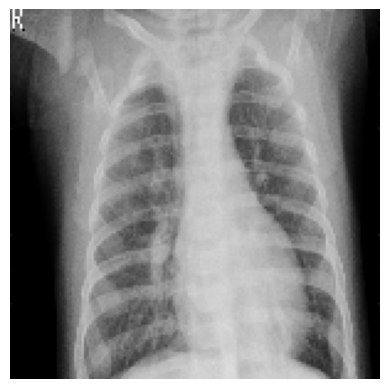

Label:  virus
Previsão:  bacteria
Probabilidade:  0.40568763


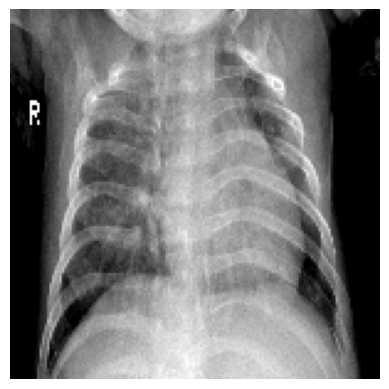

Label:  virus
Previsão:  normal
Probabilidade:  0.39569294


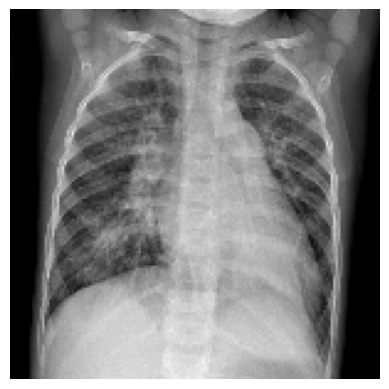

Label:  virus
Previsão:  normal
Probabilidade:  0.3942861


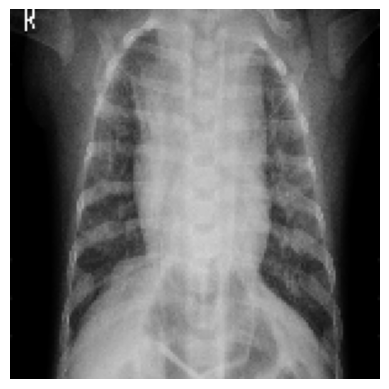

Label:  virus
Previsão:  virus
Probabilidade:  0.46059105


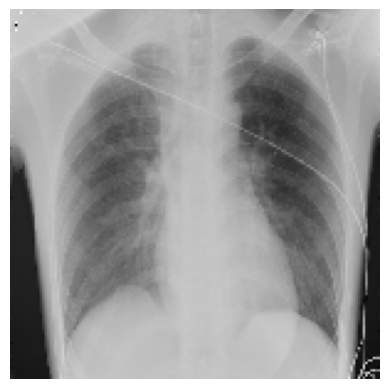

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.52721494


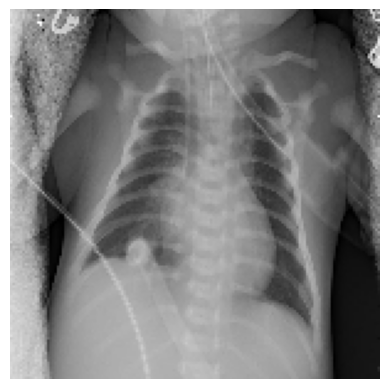

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.566205


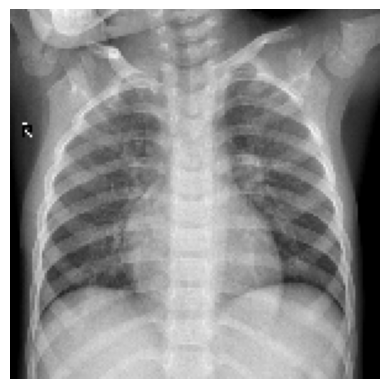

Label:  normal
Previsão:  normal
Probabilidade:  0.40244633


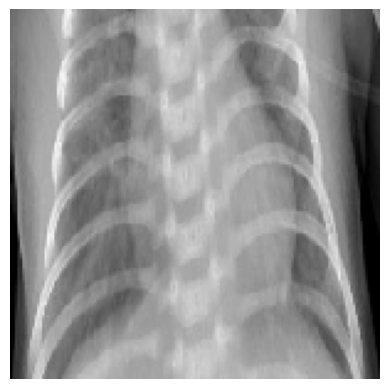

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5856157


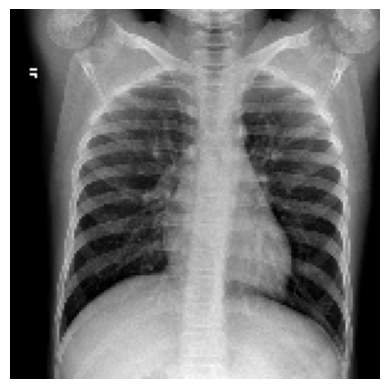

Label:  normal
Previsão:  normal
Probabilidade:  0.64717954


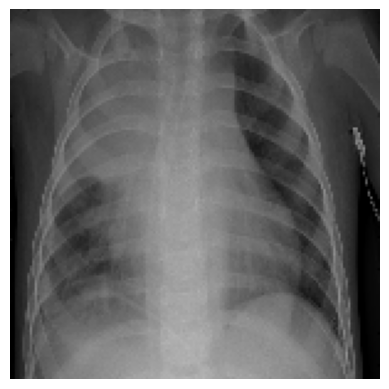

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.53798217


In [26]:
count = 0
y_pred = list()
y_true = list()
class_names = ['bacteria',
               'normal',
               'virus']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            class_name = class_names[int(predicted_class)]

            if (label == [1., 0., 0.]).all():
                real = "bacteria"
            elif (label == [0., 1., 0.]).all():
                real = "normal"
            else:
                real = "virus"

#                elif (label == [0., 0., 1.]).all():
#                real = "virus"
#            else:
#                real = "Unknown"

            y_true.append(real)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", real)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

In [27]:
loss, accuracy = model.evaluate(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

14/14 [==============================] - 30s 2s/step - loss: 0.8502 - accuracy: 0.5954
Test: accuracy = 0.595370  ;  loss = 0.850214 


In [28]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.5375
Precision:  0.5109375
Recall:  0.5375
F1 Score:  0.4774232922732362


Matriz de confusão sem normalização


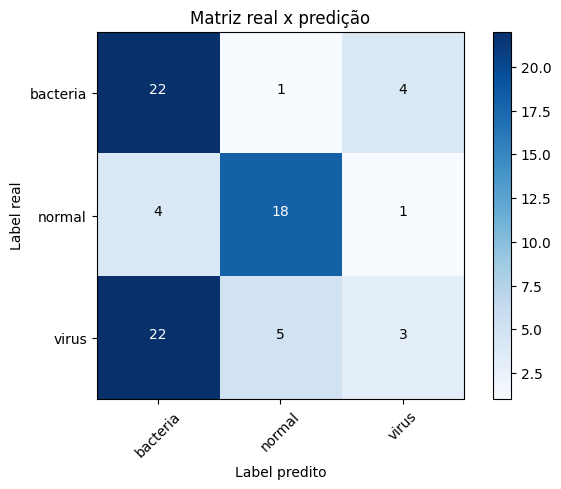

In [30]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['bacteria',
                               'normal',
                              'virus'],
                      normalize= False,
                      title='Matriz real x predição')

In [31]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/chest/trained_model'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-06-30T0320.h5


In [32]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-06-30T0320.h5 carregado com sucesso


3/3 [==============================] - 1s 330ms/step


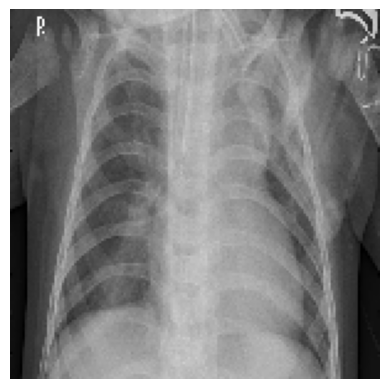

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5546451


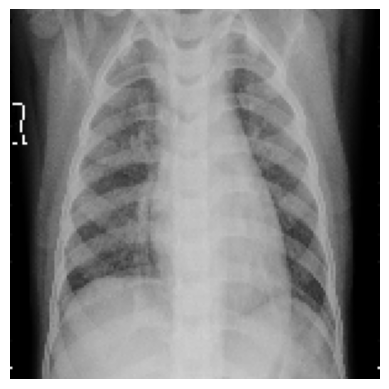

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.50873137


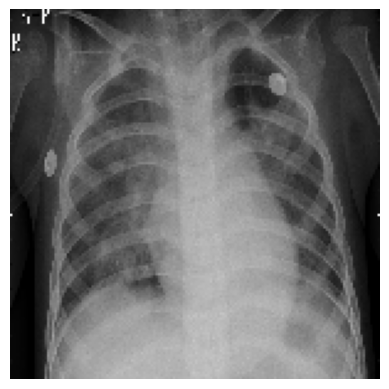

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.45610335


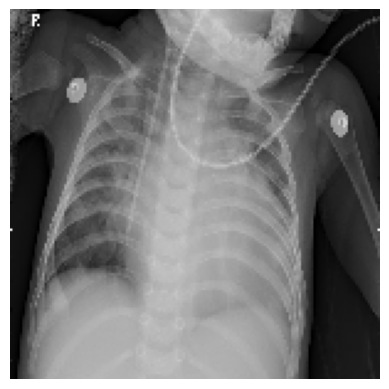

Label:  virus
Previsão:  bacteria
Probabilidade:  0.4905602


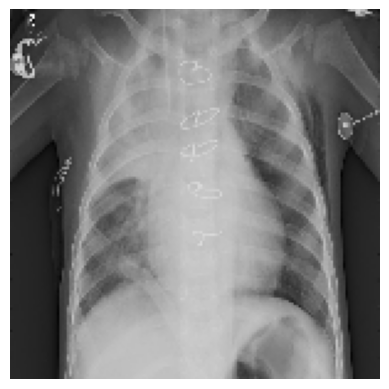

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6464346


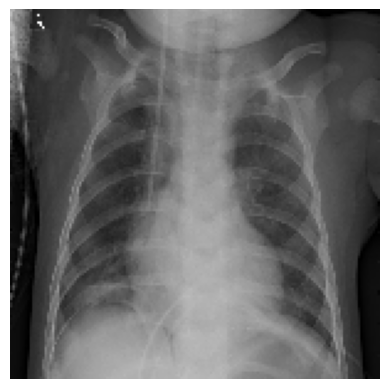

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.47946188


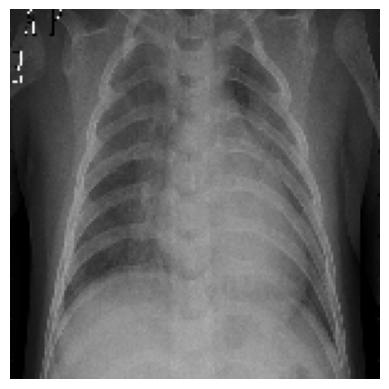

Label:  virus
Previsão:  bacteria
Probabilidade:  0.51014733


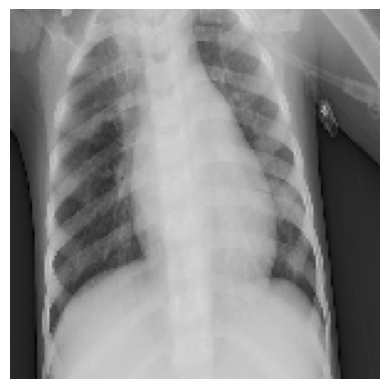

Label:  virus
Previsão:  bacteria
Probabilidade:  0.611148


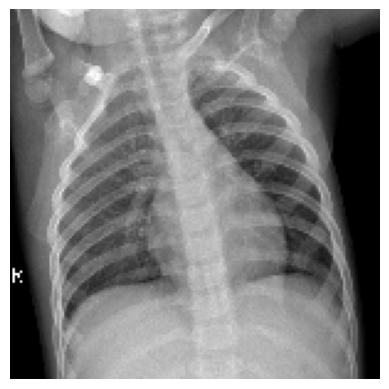

Label:  normal
Previsão:  normal
Probabilidade:  0.5089308


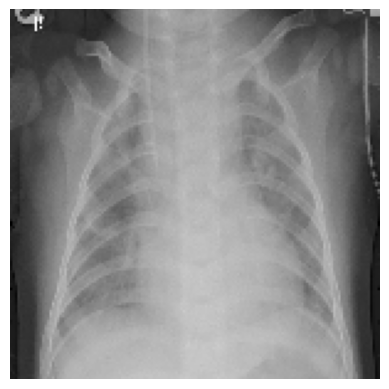

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5876269


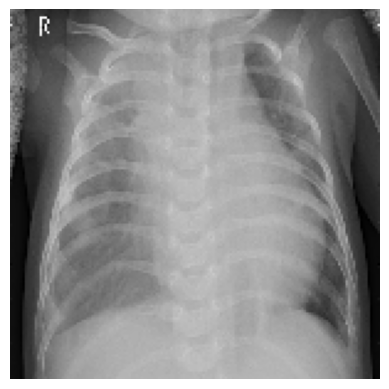

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5959912


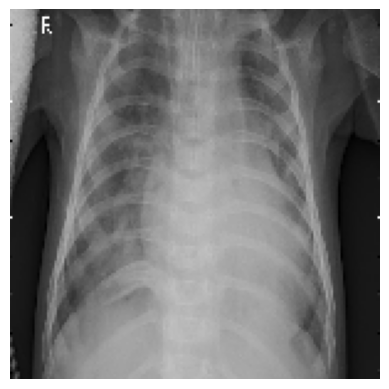

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.6201708


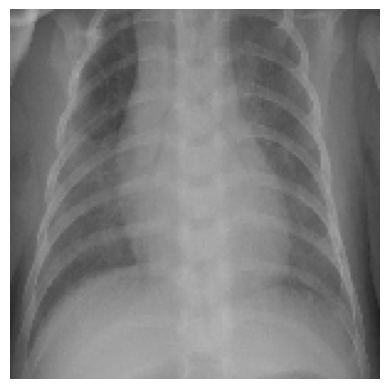

Label:  virus
Previsão:  bacteria
Probabilidade:  0.60125536


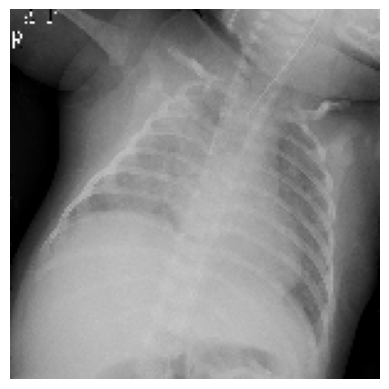

Label:  virus
Previsão:  bacteria
Probabilidade:  0.57853395


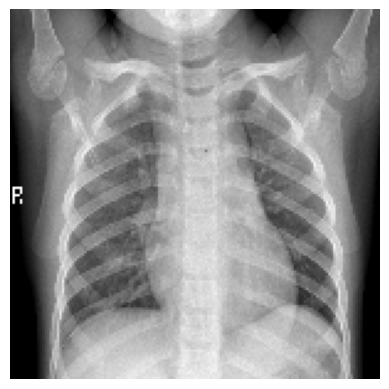

Label:  normal
Previsão:  normal
Probabilidade:  0.4181135


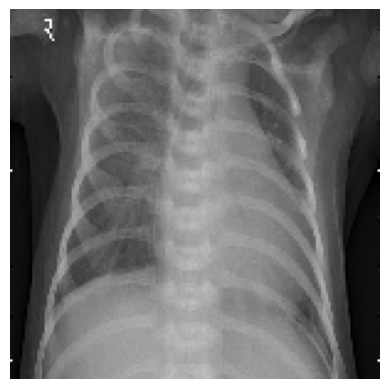

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5540386


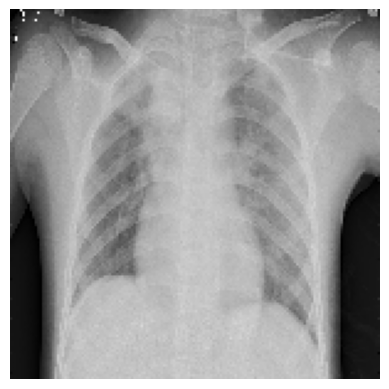

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.54214734


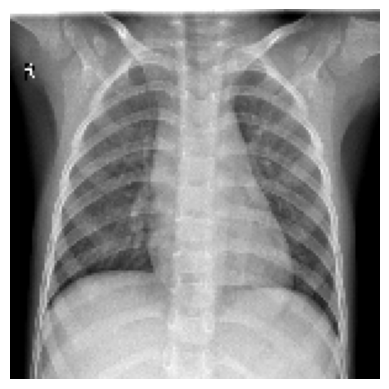

Label:  normal
Previsão:  bacteria
Probabilidade:  0.3673647


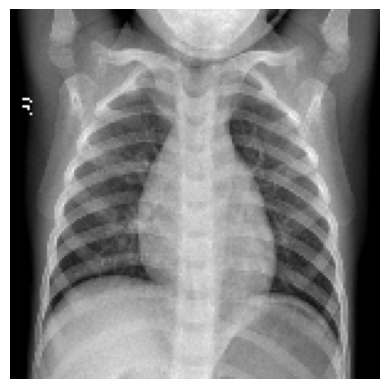

Label:  normal
Previsão:  normal
Probabilidade:  0.54615575


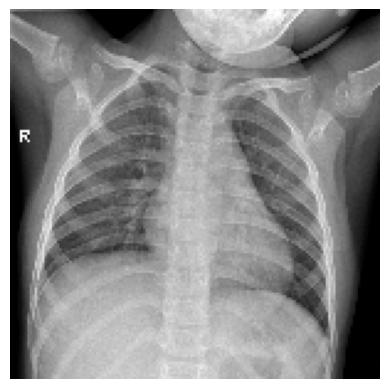

Label:  normal
Previsão:  normal
Probabilidade:  0.49738777


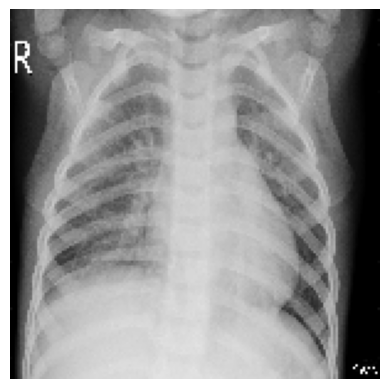

Label:  virus
Previsão:  bacteria
Probabilidade:  0.61690116


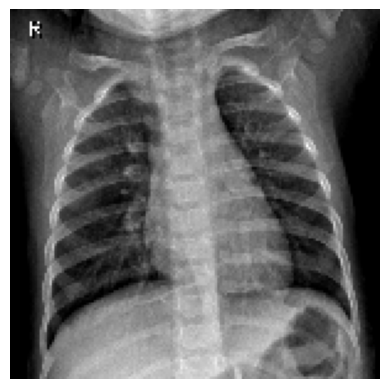

Label:  normal
Previsão:  normal
Probabilidade:  0.7315621


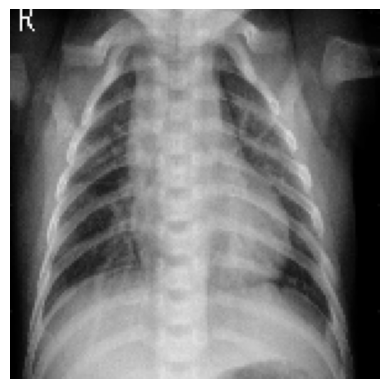

Label:  virus
Previsão:  bacteria
Probabilidade:  0.44898742


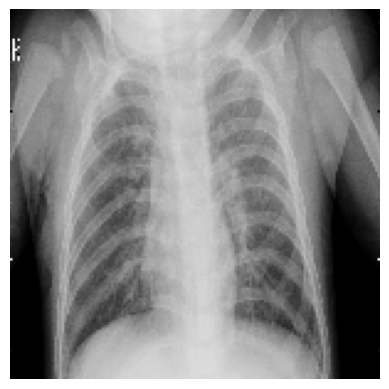

Label:  virus
Previsão:  bacteria
Probabilidade:  0.47448644


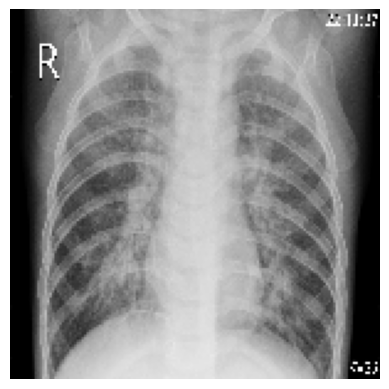

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5212242


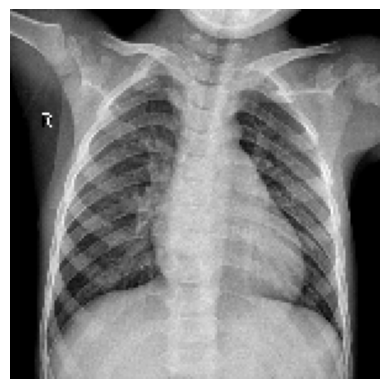

Label:  normal
Previsão:  normal
Probabilidade:  0.6937656


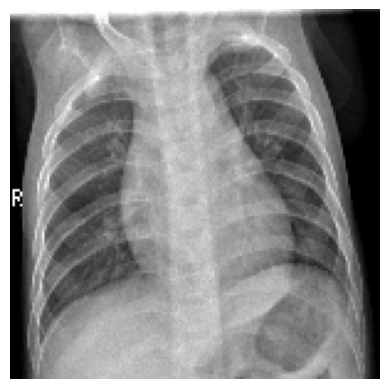

Label:  normal
Previsão:  bacteria
Probabilidade:  0.42512786


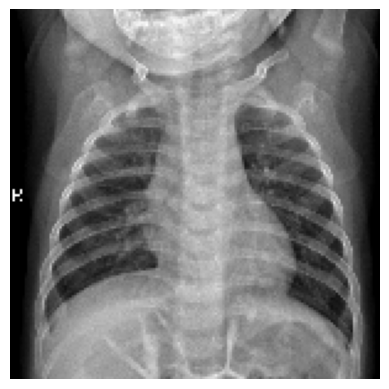

Label:  normal
Previsão:  normal
Probabilidade:  0.49477437


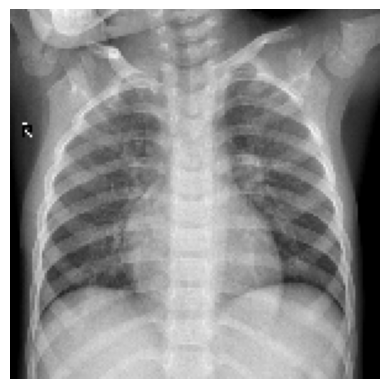

Label:  normal
Previsão:  normal
Probabilidade:  0.40244633


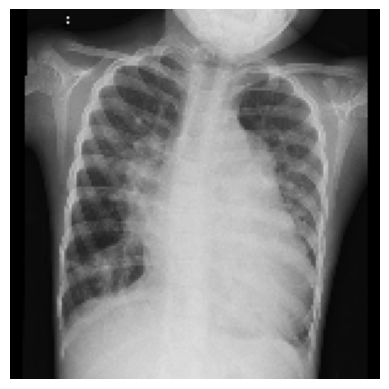

Label:  virus
Previsão:  normal
Probabilidade:  0.3565535


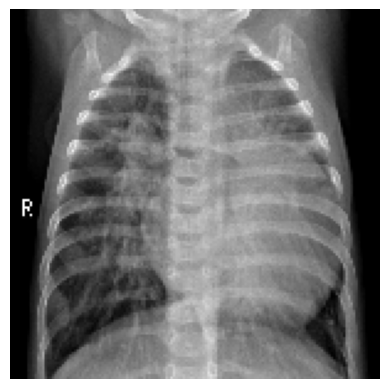

Label:  bacteria
Previsão:  normal
Probabilidade:  0.36660442


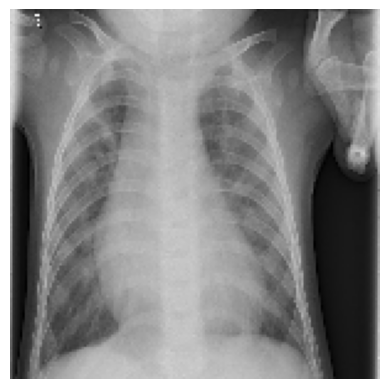

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5964859


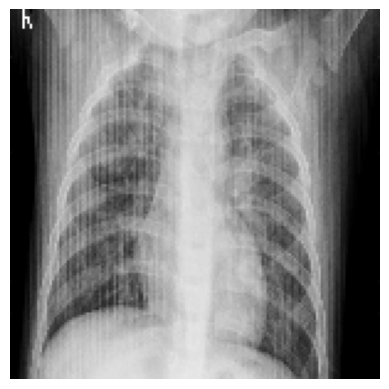

Label:  virus
Previsão:  bacteria
Probabilidade:  0.44676608


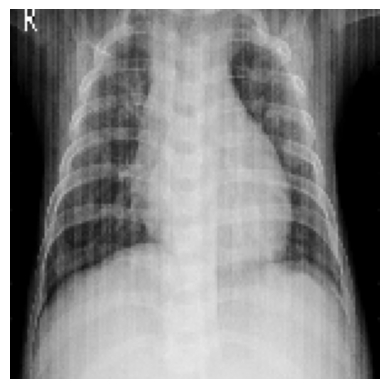

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5025748


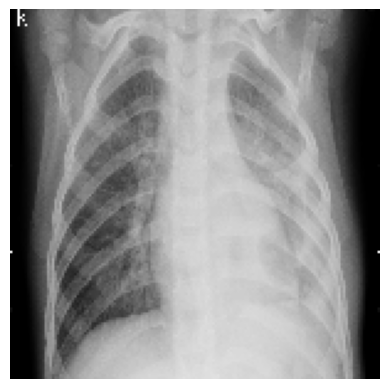

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5439084


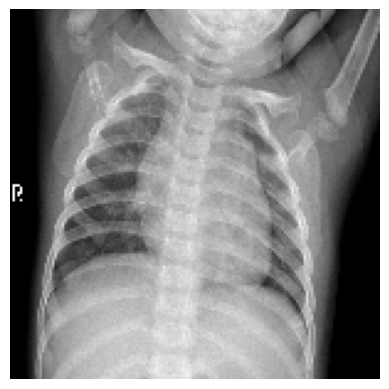

Label:  normal
Previsão:  virus
Probabilidade:  0.36034748


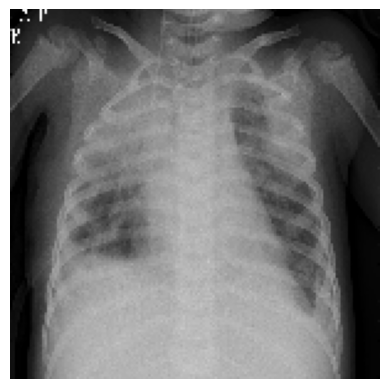

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5416784


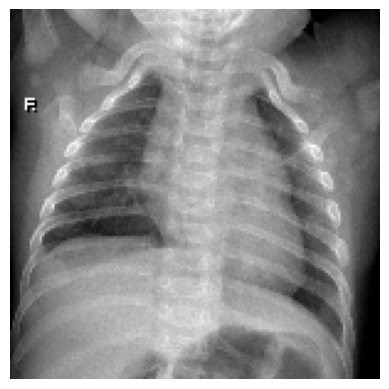

Label:  normal
Previsão:  normal
Probabilidade:  0.4220932


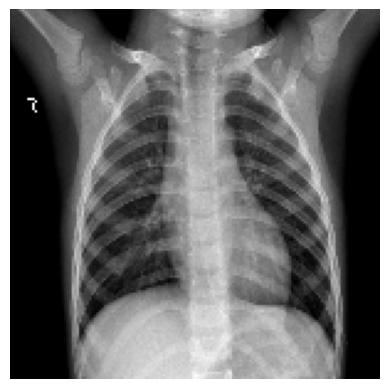

Label:  normal
Previsão:  normal
Probabilidade:  0.67373276


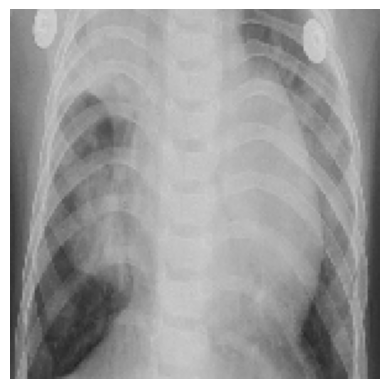

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.65628296


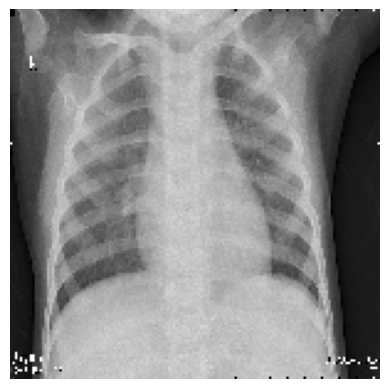

Label:  normal
Previsão:  bacteria
Probabilidade:  0.5165875


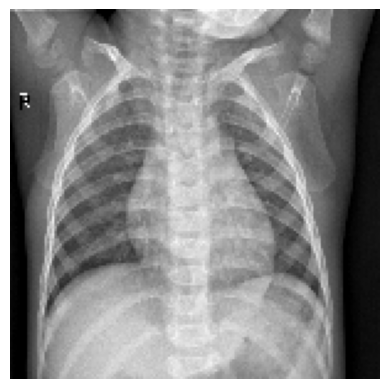

Label:  normal
Previsão:  bacteria
Probabilidade:  0.39209834


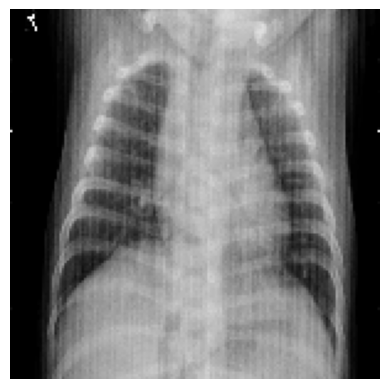

Label:  virus
Previsão:  virus
Probabilidade:  0.5156944


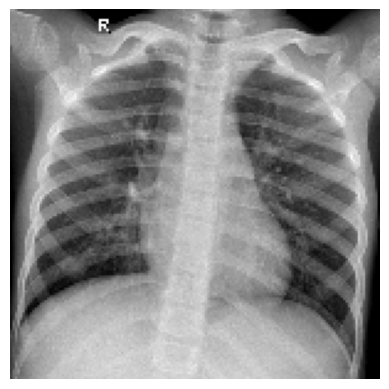

Label:  normal
Previsão:  normal
Probabilidade:  0.51828206


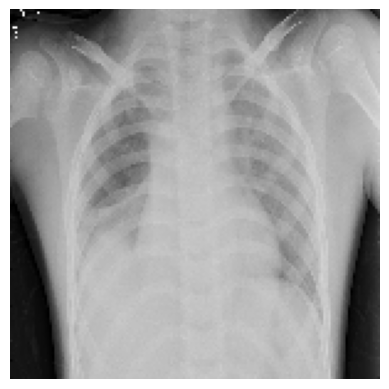

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5451652


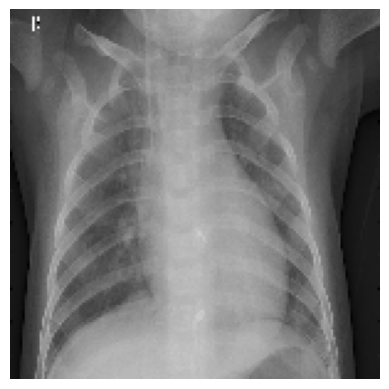

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.52766967


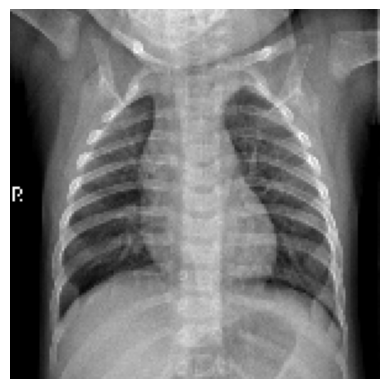

Label:  normal
Previsão:  normal
Probabilidade:  0.52330506


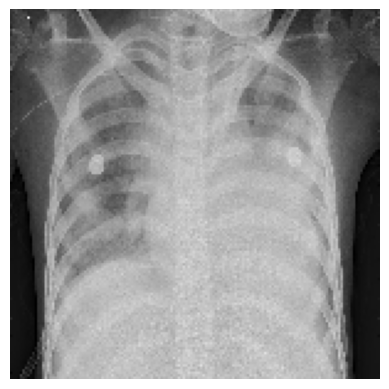

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5786623


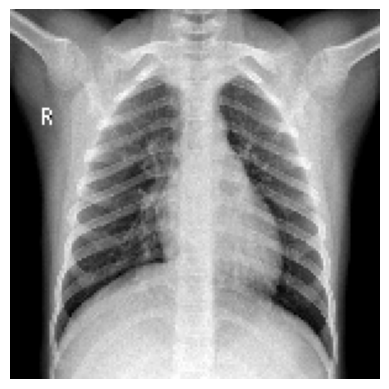

Label:  normal
Previsão:  normal
Probabilidade:  0.63649434


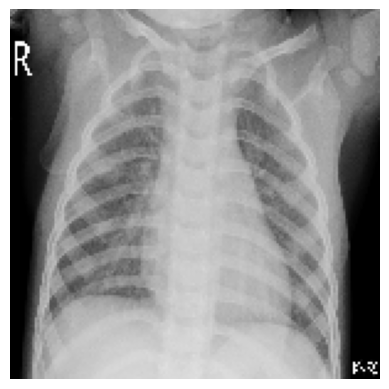

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5618839


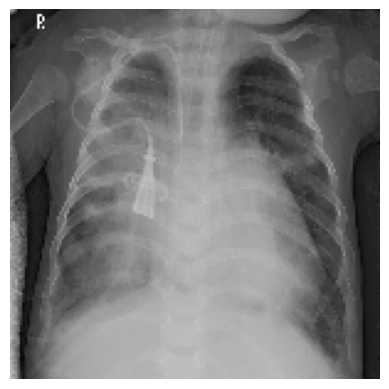

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5895498


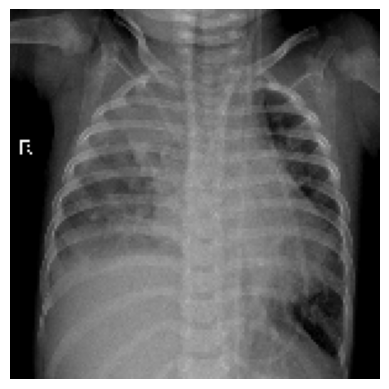

Label:  bacteria
Previsão:  virus
Probabilidade:  0.477751


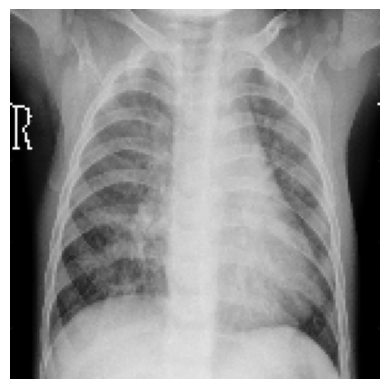

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5145986


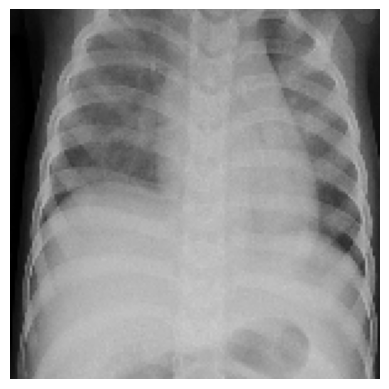

Label:  virus
Previsão:  bacteria
Probabilidade:  0.51279724


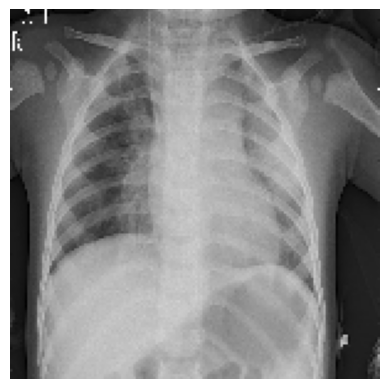

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5285115


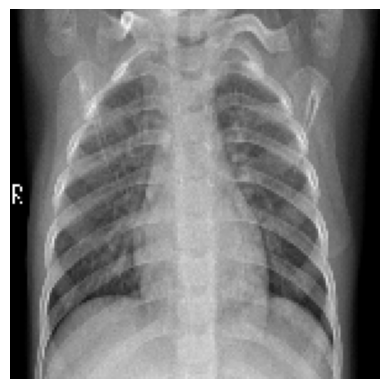

Label:  virus
Previsão:  bacteria
Probabilidade:  0.3616167


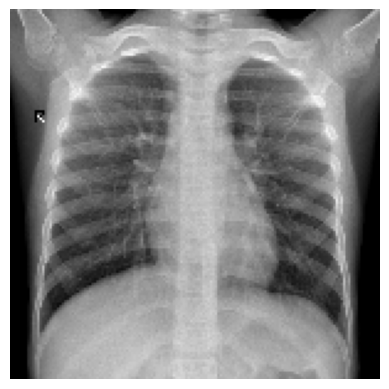

Label:  normal
Previsão:  normal
Probabilidade:  0.52456653


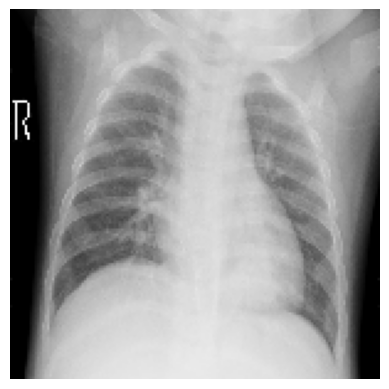

Label:  virus
Previsão:  bacteria
Probabilidade:  0.43721372


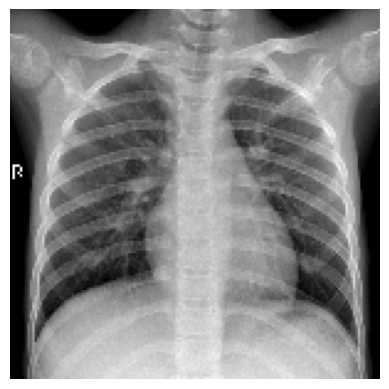

Label:  normal
Previsão:  normal
Probabilidade:  0.6582209


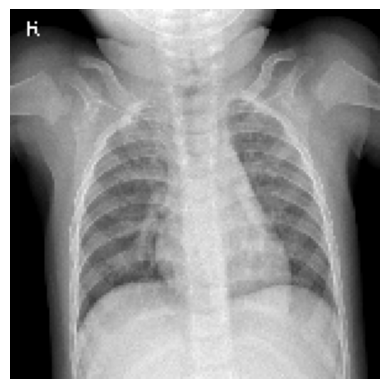

Label:  normal
Previsão:  virus
Probabilidade:  0.36769202


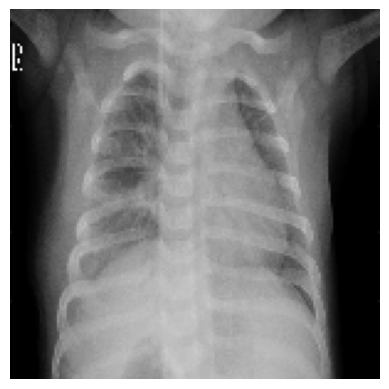

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5194317


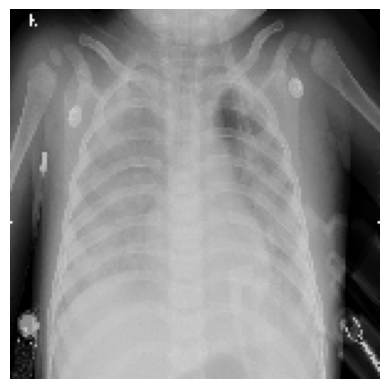

Label:  virus
Previsão:  bacteria
Probabilidade:  0.56736535


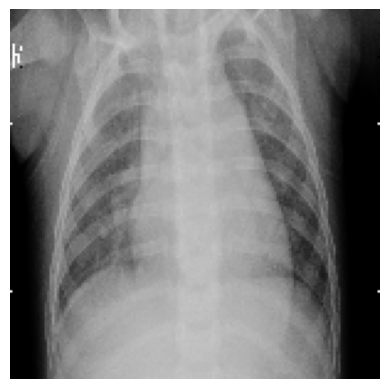

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5500836


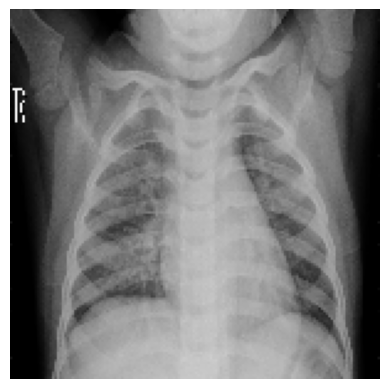

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.46311757


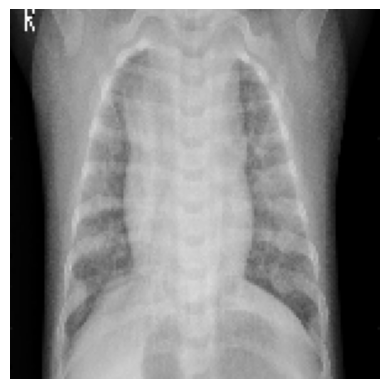

Label:  virus
Previsão:  bacteria
Probabilidade:  0.50733215


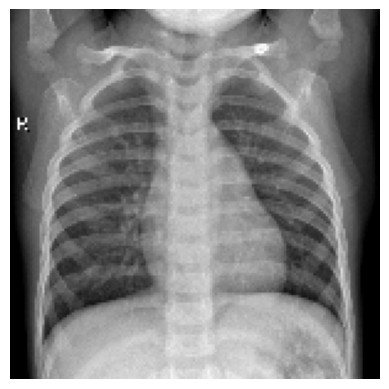

Label:  normal
Previsão:  normal
Probabilidade:  0.52354175


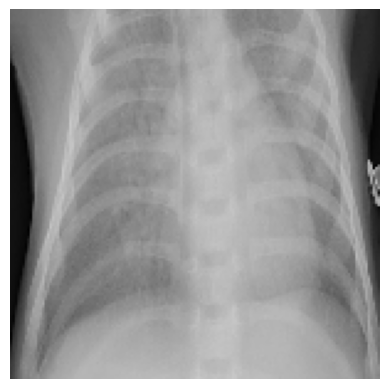

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.60735005


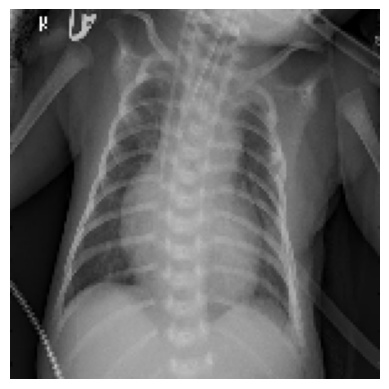

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.59654146


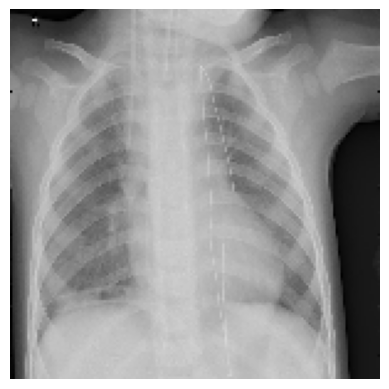

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5882596


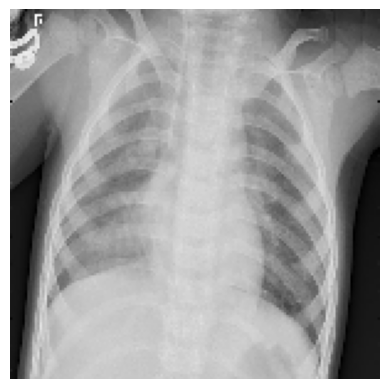

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.62291574


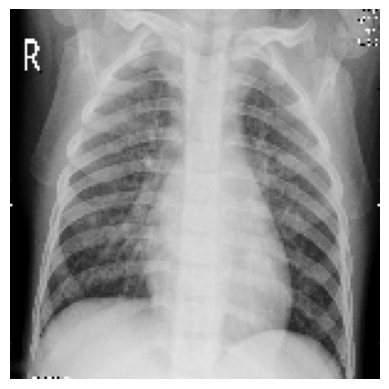

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5273034


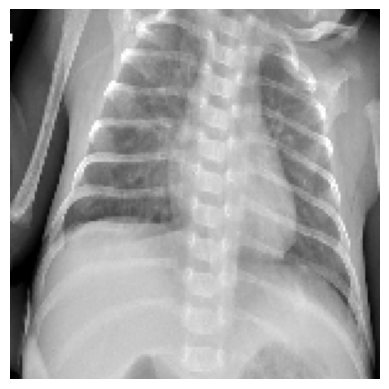

Label:  virus
Previsão:  bacteria
Probabilidade:  0.51400715


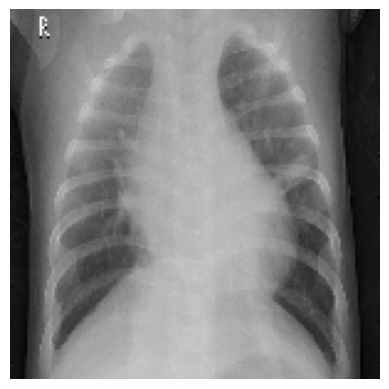

Label:  virus
Previsão:  bacteria
Probabilidade:  0.58656675


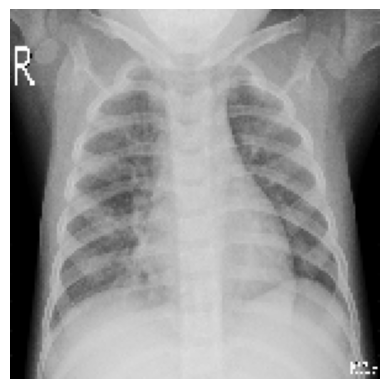

Label:  virus
Previsão:  bacteria
Probabilidade:  0.5481815


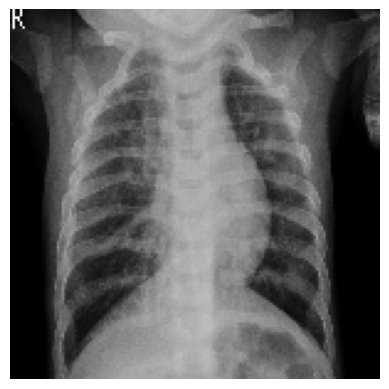

Label:  virus
Previsão:  virus
Probabilidade:  0.36004645


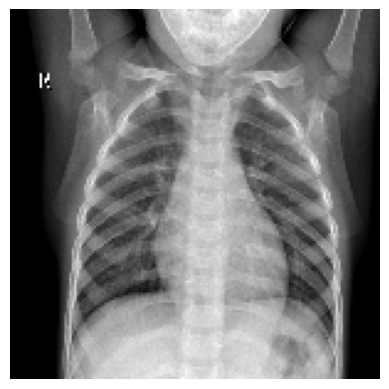

Label:  normal
Previsão:  normal
Probabilidade:  0.4944288


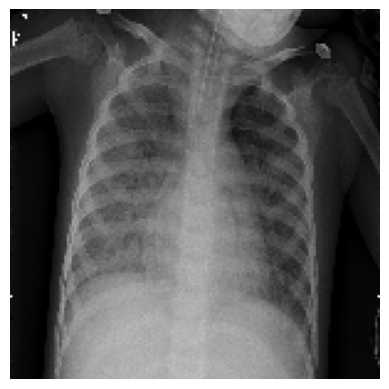

Label:  bacteria
Previsão:  virus
Probabilidade:  0.39416072


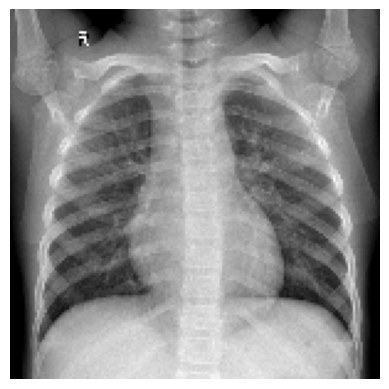

Label:  normal
Previsão:  normal
Probabilidade:  0.54778683


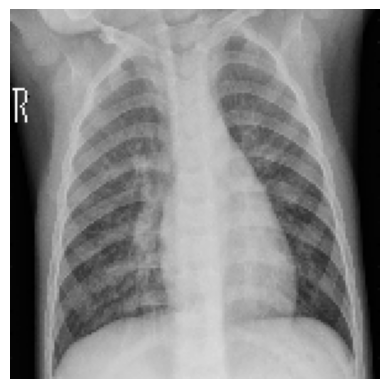

Label:  bacteria
Previsão:  bacteria
Probabilidade:  0.5189888


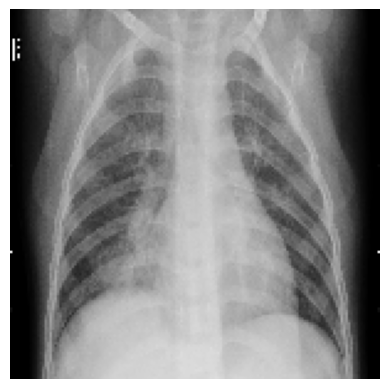

Label:  virus
Previsão:  bacteria
Probabilidade:  0.4839539


In [36]:
count = 0
y_pred = list()
y_true = list()
class_names = ['bacteria',
               'normal',
               'virus']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            class_name = class_names[int(predicted_class)]

            if (label == [1., 0., 0.]).all():
                real = "bacteria"
            elif (label == [0., 1., 0.]).all():
                real = "normal"
            else:
                real = "virus"

            y_true.append(real)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", real)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

In [37]:
loss, accuracy = model.evaluate(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

14/14 [==============================] - 29s 2s/step - loss: 0.8502 - accuracy: 0.5954
Test: accuracy = 0.595370  ;  loss = 0.850214 


In [38]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.5625
Precision:  0.5487037037037037
Recall:  0.5625
F1 Score:  0.5000456501891223
